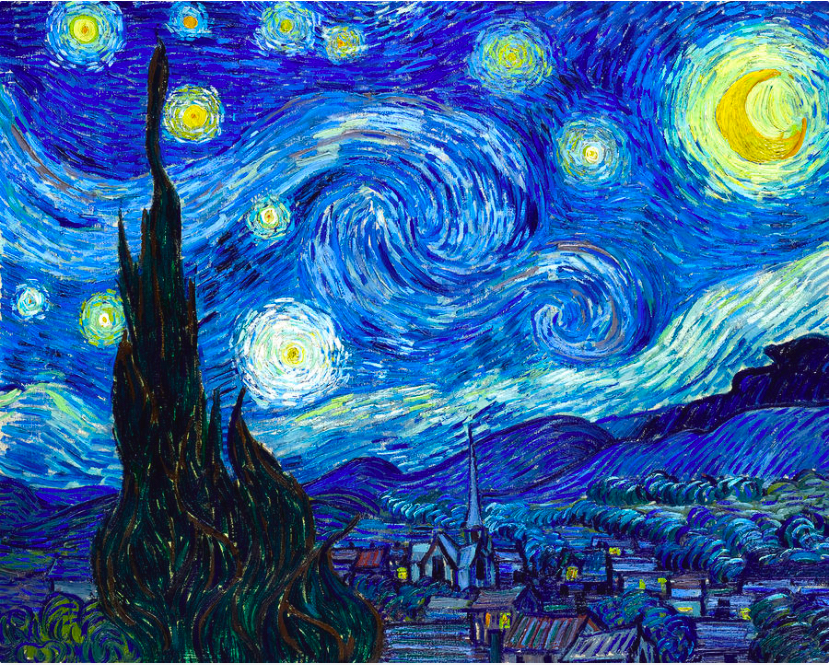

In [1]:
import PIL
from PIL import Image
from IPython.display import display

file = "/Users/saurabhkumarsingh/Documents/GitHub/Learning_python/UoM_Specializations/P3_C5_Python Projectpillow tesseract and opencv/starry.jpg"
image = Image.open(file).convert('RGB')
display(image)

In [2]:
# creating contactsheet by changing its brightness 
from PIL import ImageEnhance
help(ImageEnhance)

Help on module PIL.ImageEnhance in PIL:

NAME
    PIL.ImageEnhance

DESCRIPTION
    # The Python Imaging Library.
    # $Id$
    #
    # image enhancement classes
    #
    # For a background, see "Image Processing By Interpolation and
    # Extrapolation", Paul Haeberli and Douglas Voorhies.  Available
    # at http://www.graficaobscura.com/interp/index.html
    #
    # History:
    # 1996-03-23 fl  Created
    # 2009-06-16 fl  Fixed mean calculation
    #
    # Copyright (c) Secret Labs AB 1997.
    # Copyright (c) Fredrik Lundh 1996.
    #
    # See the README file for information on usage and redistribution.
    #

CLASSES
    _Enhance(builtins.object)
        Brightness
        Color
        Contrast
        Sharpness
    
    class Brightness(_Enhance)
     |  Brightness(image)
     |  
     |  Adjust image brightness.
     |  
     |  This class can be used to control the brightness of an image.  An
     |  enhancement factor of 0.0 gives a black image. A factor of 1.0 gives the

In [24]:
# brightness = (0,1) - black to original
# color = (0,1) - b/w to original 
enhancer = ImageEnhance.Brightness(image)
colorchanger = ImageEnhance.Color(image)
contrastchanger = ImageEnhance.Contrast(image)
type(enhancer)

PIL.ImageEnhance.Brightness

In [6]:
import sys
sys.getsizeof(enhancer)
sys.getsizeof(image)


50

In [9]:
help(enhancer)

Help on Brightness in module PIL.ImageEnhance object:

class Brightness(_Enhance)
 |  Brightness(image)
 |  
 |  Adjust image brightness.
 |  
 |  This class can be used to control the brightness of an image.  An
 |  enhancement factor of 0.0 gives a black image. A factor of 1.0 gives the
 |  original image.
 |  
 |  Method resolution order:
 |      Brightness
 |      _Enhance
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __init__(self, image)
 |      Initialize self.  See help(type(self)) for accurate signature.
 |  
 |  ----------------------------------------------------------------------
 |  Methods inherited from _Enhance:
 |  
 |  enhance(self, factor)
 |      Returns an enhanced image.
 |      
 |      :param factor: A floating point value controlling the enhancement.
 |                     Factor 1.0 always returns a copy of the original image,
 |                     lower factors mean less color (brightness, contrast,
 |                     etc), and higher v

In [55]:
images = []
color_images = []
contrast_images = [] 
for i in range(0,10):
    images.append(enhancer.enhance(i/10))
    color_images.append(colorchanger.enhance(i/10))
    contrast_images.append(contrastchanger.enhance(i/10))
print(images)
print(color_images)
print(contrast_images)

    

[<PIL.Image.Image image mode=RGB size=830x665 at 0x7F943C0D9F40>, <PIL.Image.Image image mode=RGB size=830x665 at 0x7F943CA299D0>, <PIL.Image.Image image mode=RGB size=830x665 at 0x7F943BEDBB50>, <PIL.Image.Image image mode=RGB size=830x665 at 0x7F943CA294C0>, <PIL.Image.Image image mode=RGB size=830x665 at 0x7F943C95CBE0>, <PIL.Image.Image image mode=RGB size=830x665 at 0x7F943C95C100>, <PIL.Image.Image image mode=RGB size=830x665 at 0x7F943CA37910>, <PIL.Image.Image image mode=RGB size=830x665 at 0x7F943CA37580>, <PIL.Image.Image image mode=RGB size=830x665 at 0x7F943CA37FA0>, <PIL.Image.Image image mode=RGB size=830x665 at 0x7F943C0D1DF0>]
[<PIL.Image.Image image mode=RGB size=830x665 at 0x7F943BF07CD0>, <PIL.Image.Image image mode=RGB size=830x665 at 0x7F943CA29340>, <PIL.Image.Image image mode=RGB size=830x665 at 0x7F943CA29F10>, <PIL.Image.Image image mode=RGB size=830x665 at 0x7F943CA29730>, <PIL.Image.Image image mode=RGB size=830x665 at 0x7F943C95C1F0>, <PIL.Image.Image image 

In [13]:
# making contact sheet 

help(PIL.Image.new)

Help on function new in module PIL.Image:

new(mode, size, color=0)
    Creates a new image with the given mode and size.
    
    :param mode: The mode to use for the new image. See:
       :ref:`concept-modes`.
    :param size: A 2-tuple, containing (width, height) in pixels.
    :param color: What color to use for the image.  Default is black.
       If given, this should be a single integer or floating point value
       for single-band modes, and a tuple for multi-band modes (one value
       per band).  When creating RGB images, you can also use color
       strings as supported by the ImageColor module.  If the color is
       None, the image is not initialised.
    :returns: An :py:class:`~PIL.Image.Image` object.



In [26]:
for i in contrast_images:
    i.show()

In [27]:
first_image = images[0]
from PIL import Image
contact_sheet_brightness = PIL.Image.new(first_image.mode , (first_image.width,10*first_image.height))
contact_sheet_color = PIL.Image.new(first_image.mode , (first_image.width,10*first_image.height))
contact_sheet_contrast = PIL.Image.new(first_image.mode , (first_image.width,10*first_image.height))


In [28]:
# using paste function to paste images in contact sheet 
 # counter location for y position, x not chaning 
current_location = 0
for img in images : 
    contact_sheet_brightness.paste(img,(0,current_location))
    current_location = current_location + first_image.height

In [30]:
contact_sheet_brightness.show()

In [42]:
# using zip function to create a tuple from 3 lists of images 
# and using a single loop to create 3 differnt coontact sheets 
current_location = 0
allimages = zip(images,color_images , contrast_images)
for bright, color, contrast in allimages : 
    contact_sheet_brightness.paste(bright,(0,current_location))
    contact_sheet_color.paste(color,(0,current_location))
    contact_sheet_contrast.paste(contrast,(0,current_location))
    
    current_location = current_location + first_image.height

In [56]:
contact_sheet_brightness.show()
contact_sheet_color.show()
contact_sheet_contrast.show()


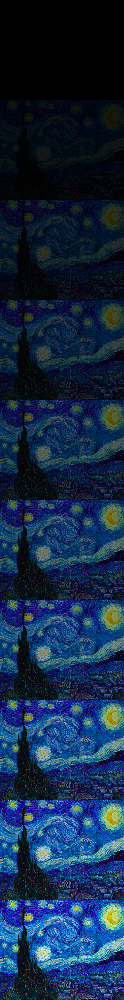

In [41]:
display(contact_sheet_brightness)

In [43]:
print(contact_sheet_brightness.height,contact_sheet_brightness.width)

6650 830


In [57]:
canvas_brightness = PIL.Image.new(first_image.mode , (3*first_image.width,3*first_image.height))
canvas_color = PIL.Image.new(first_image.mode , (first_image.width*3,3*first_image.height))
canvas_contrast = PIL.Image.new(first_image.mode , (first_image.width*3,3*first_image.height))

In [50]:
help(canvas_brightness.paste)

Help on method paste in module PIL.Image:

paste(im, box=None, mask=None) method of PIL.Image.Image instance
    Pastes another image into this image. The box argument is either
    a 2-tuple giving the upper left corner, a 4-tuple defining the
    left, upper, right, and lower pixel coordinate, or None (same as
    (0, 0)). See :ref:`coordinate-system`. If a 4-tuple is given, the size
    of the pasted image must match the size of the region.
    
    If the modes don't match, the pasted image is converted to the mode of
    this image (see the :py:meth:`~PIL.Image.Image.convert` method for
    details).
    
    Instead of an image, the source can be a integer or tuple
    containing pixel values.  The method then fills the region
    with the given color.  When creating RGB images, you can
    also use color strings as supported by the ImageColor module.
    
    If a mask is given, this method updates only the regions
    indicated by the mask.  You can use either "1", "L" or "RGBA

In [62]:
# looping to paste images on canvas , neglecting the first one , 9 images only 
x = 0
y = 0
for img in images[1:]:
    canvas_brightness.paste(img,(x,y))
    # first updating x from going end to end in canvas in first line 
    # then setting it to zero, update Y to go into the next line 
    
    if x + first_image.width == canvas_brightness.width :
        x = 0
        y = y + first_image.height
    else :
        #moving horizontaly, not vertically
        x = x + first_image.width



In [63]:
canvas_brightness.show()

In [64]:
# using zip to do all in one time

x = 0
y = 0
allimages = zip(images[1:],color_images[1:] , contrast_images[1:])
for bright,color,contrast in allimages :
    canvas_brightness.paste(bright,(x,y))
    canvas_color.paste(color,(x,y))
    canvas_contrast.paste(contrast,(x,y))
    # first updating x from going end to end in canvas in first line 
    # then setting it to zero, update Y to go into the next line 
    
    if x + first_image.width == canvas_brightness.width :
        x = 0
        y = y + first_image.height
    else :
        #moving horizontaly, not vertically
        x = x + first_image.width
    

In [65]:
canvas_brightness.show()
canvas_color.show()
canvas_contrast.show()

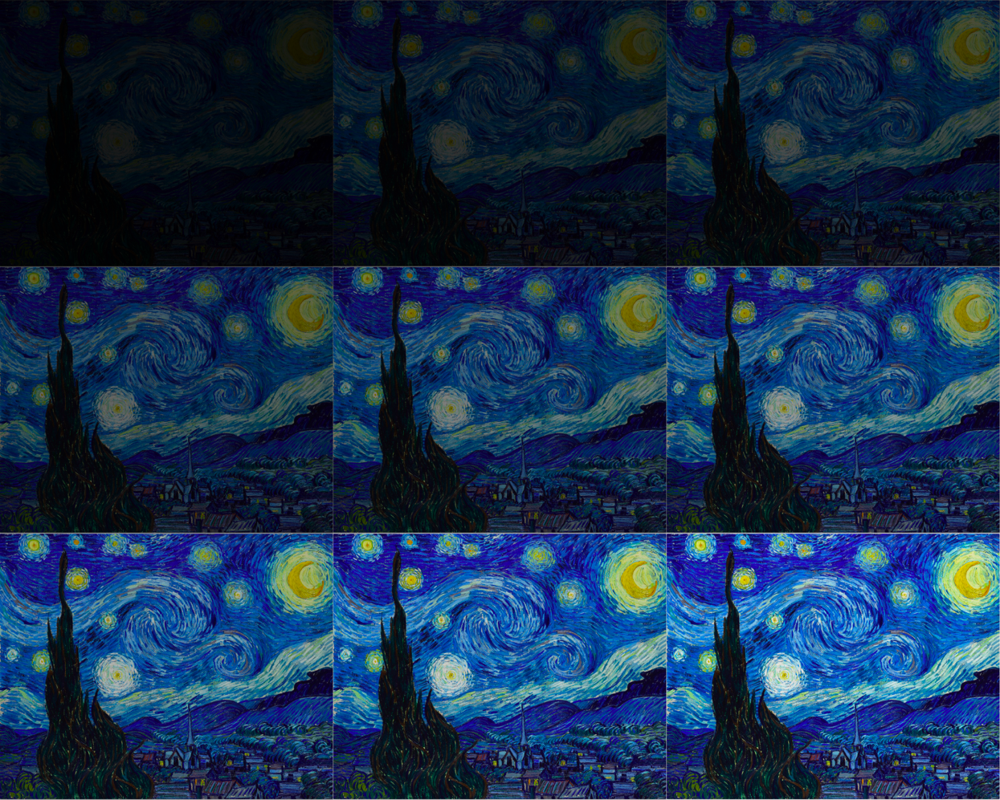

In [66]:
# resizing the images 

canvas_brightness_re = canvas_brightness.resize((int(canvas_brightness.width/2),int(canvas_brightness.height/2)))
display(canvas_brightness_re)

In [70]:
canvas_brightness.save("starry_bright.jpg")

In [71]:
canvas_brightness.save("starry_bright.jpg")
canvas_color.save("starry_color.jpg")
canvas_contrast.save("starry_contrast.jpg")